# CS216 : Assignment 2

Reading: Review your class notes, Klette Chapter 1.2-1.3,
Szeliski Chapter 2,3 and/or Forsyth and Ponce Chapters 1,4,8,9

For written problems, you can either use Markdown/LaTeX to directly enter your reponse in the provided notebook cell, or if you prefer, write out by hand and embed a photo of your solution. For coding problems, I have provided some suggestion of how to structure your code but feel free to modify or ignore as you see fit.

Please edit the cell below to include your name and student ID #

---

**name:** Fu-Cheng Hsieh

**SID:** 55284118

---

In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from numpy import fft
from scipy import ndimage
import cv2 # for loading image

%matplotlib inline
conv = ndimage.convolve

## 1. Convolution versus Correlation

Prove that *convolution* is associative, that is  $(f \star g) \star h = f \star (g \star h)$

Prove that *correlation* is not associative (best done by showing a counter-example)

You should just show this for discrete 1D signals and assume the signal has been extended periodically as we did in lecture. 

Consider 1D signals: $f = [1, 2, 3], g = [1, 0, -1]$, and $h = [1, 0, -1]$

- For convolution:
    - $(f \star g) = [-1, -2, -2,  2,  3]$, and $(f\star g)\star h = [1, 2, 1, -4, -5, 2, 3]$
    - $(g \star h) = [1,  0, -2,  0,  1]$, and $f \star (g \star h) = [1, 2, 1, -4, -5, 2, 3]$

So $(f \star g) \star h = f \star (g \star h)$ 

In [2]:
F = [1, 2, 3]
G = [1, 0, -1]
H = [1, 0, -1]
F_conv_G = np.convolve(F, G)
G_conv_H = np.convolve(G, H)

print("(F * G) * H:", list(np.convolve(F_conv_G, H)))
print("F * (G * H):", list(np.convolve(F, G_conv_H)))

(F * G) * H: [1, 2, 1, -4, -5, 2, 3]
F * (G * H): [1, 2, 1, -4, -5, 2, 3]


We show that using the same example, correlation is not associative (denote correlation as $\ast$):
- $(F \ast G) = [1,  2,  2, -2, -3]$, and $(F \ast G) \ast H = [1, 2, 1, -4, -5, 2, 3]$
- $(G \ast H) = [-1,  0,  2,  0, -1]$, and $F \ast (G \ast H) = [-1, -2, -1, 4, 5, -2, -3]$

So correlation is not associative.

In [3]:
# For correlation:
print("(F corr G) corr H:", list(np.correlate(np.correlate(F, G, "full"), H, "full")))
print("F corr (G corr H):", list(np.correlate(F, np.correlate(G, H, "full"), "full")))

(F corr G) corr H: [1, 2, 1, -4, -5, 2, 3]
F corr (G corr H): [-1, -2, -1, 4, 5, -2, -3]


## 2. Fast Fourier Transform

If we have an image $I$ of dimension $H$x$W$ and we convolve it with a
filter $f$ of size $M$x$N$ using the spatial domain formula given in class,
what will the complexity be (i.e. how many multiplications)?  How about if we
use the [Fast Fourier Transform](https://en.wikipedia.org/wiki/Fast_Fourier_transform) "trick"?

- The time complexity of using convolution in spatial domain is $O(HWMN)$, since for each pixel ($H \times W$) we do $M \times N$ multiplications.
- Using FFT, we can convolve $I$ and $f$ by $I \star f = F^{-1}(F(I) \cdot F(f))$
    - 2D FFT runs in $O(mn\log(mn)$)
    - We convert $I$ and $f$ to frequency domain first, and then perform elementwise multiplication
        - The time complexity of elementwise multiplication is $HW$ (suppose $HW >> MN$)
        - Finally, we use invert FFT to get the result (IFFT runs in $O(HW\log(HW)$)
    - Therefore, the overall compexity is $O(2HW\log(HW) + MN\log(MN) + HW) = O(HW\log(HW))$

## 3. Factorizing Filters
Starting with the formula for 2D convolution, show that if our filter is
the product of two functions, $f(x,y)=f_1(x)f_2(y)$, we can compute the
convolution more efficiently.  Is there a way to use this idea to speed up
convlution with a 2D isotropic Gaussian filter $g(x,y) = \frac{1}{2\pi\sigma^2}
\exp^{\frac{-(x^2 + y^2)}{2 \sigma^2}}$?

1. Suppose we have a $N \times M$ image and a filter $F$ of size $L \times L$. When convolving the image with the filter, each pixel performs $L^2$ operations, resulting in total $MNL^2$ operations. If we can separate $F$ into two 1d vectors $F_x, F_y$, we can calculate all rows first ($MNL$) and then calculate columns ($MNL$). The total operations are now $O(MN(L+L)) = O(MNL)$, which is more efficient than its 2d version ($O(MNL^2)$).
2. The 2D Gaussian can be expressed as the product of $G_{\sigma}(x)$ and $G_{\sigma}(y)$: $G_{\sigma}(x, y)$ can be decomposed into $G_{\sigma}(x) \cdot G_{\sigma}(y) = \left( \frac{1}{\sqrt{2\pi}\sigma}\exp^{-\frac{x^2}{2\sigma^2}}\right) \left(\frac{1}{\sqrt{2\pi}\sigma}\exp^{-\frac{y^2}{2\sigma^2}}\right)$. Both $G_{\sigma}(x)$ and $G_{\sigma}(y)$ are 1D Gaussian; by separating the original 2D filter into two 1D filters, we can compute the convolution more efficiently.

## 4. Experimenting with the DFT

Import the appropriate functions from the numpy [fft module](https://numpy.org/doc/stable/reference/routines.fft.html) and carry out some experiments yourself. You will want to use the ***fftshift*** function to get the spectra like we showed in class where 0 is at the center

**4.1** Start out in 1D and make a signal which is of length 100 with a single
impulse of height 1 in the middle.  Compute the DFT of the signal and plot the
magnitude of the spectrum.

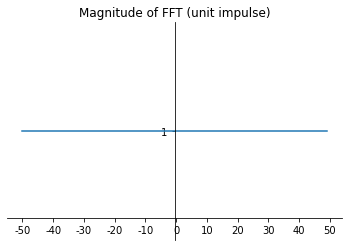

In [4]:
# we create a unit impulse function
signal = [0] * 100
signal[0] = 1
# calculate dft
dft = fft.fft(signal)
magnitude = fft.fftshift(np.abs(dft))
# plot magnitude
fig, ax = plt.subplots(figsize=(6, 4))
ax.spines["left"].set_position("center")
ax.spines["bottom"].set_position(("axes", 0.1))
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xticks(np.arange(0, 110, 10))
ax.set_xticklabels(np.arange(-50, 60, 10))
ax.set_yticks(np.arange(0, 2))
plt.title("Magnitude of FFT (unit impulse)")
plt.plot(magnitude)
plt.show()

**4.2** Now increase the width of the pulse from a single sample to a unit height
``box function'' 5 and 10 samples long and plot resulting the spectrum
magnitudes.

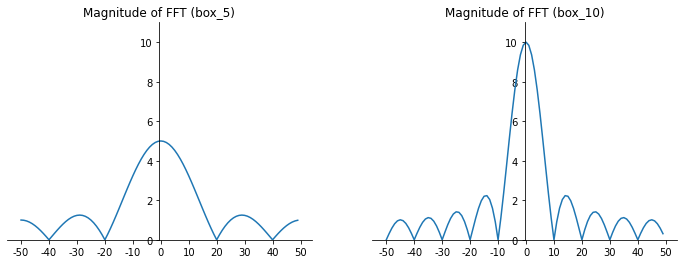

In [5]:
# 5 samples long
box_5 = [1] * 5 + [0] * (100 - 5)
dft_5 = fft.fft(box_5)
mag_5 = fft.fftshift(np.abs(dft_5))

# 10 samples long
box_10 = [1] * 10 + [0] * (100 - 10)
dft_10 = fft.fft(box_10)
mag_10 = fft.fftshift(np.abs(dft_10))

# plot fft magnitude for 5, 10 samples long
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
for s in range(2):
    sample = mag_5 if s == 0 else mag_10
    title = "Magnitude of FFT (box_%d)" % (5 if s == 0 else 10)
    
    ax[s].spines["left"].set_position("center")
    ax[s].spines['right'].set_color('none')
    ax[s].spines['top'].set_color('none')
    ax[s].set_xticks(np.arange(0, 110, 10))
    ax[s].set_xticklabels(np.arange(-50, 60, 10))
    ax[s].set_ylim([0, 11])
    ax[s].set_title(title)
    ax[s].plot(sample)
plt.show()

**4.3** Now do the same for a Gaussian function with $\sigma = 1$
and $\sigma = 2$ (the Gaussian has infinite support but you should just analyze
a finite chunk centered around the origin).

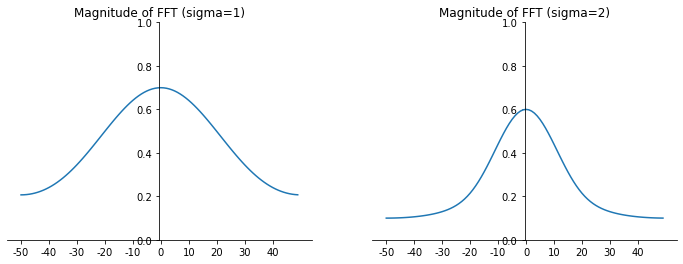

In [6]:
def gaussian(n=100, sigma=1):
    x = np.arange(n)
    return 1. / (sigma * np.sqrt(2*np.pi)) * np.exp(-(x**2) / (2 * sigma**2))

sigma_1 = gaussian(sigma=1)
dft_sig_1 = fft.fft(sigma_1)
mag_sig_1 = fft.fftshift(np.abs(dft_sig_1))

sigma_2 = gaussian(sigma=2)
dft_sig_2 = fft.fft(sigma_2)
mag_sig_2 = fft.fftshift(np.abs(dft_sig_2))

# plot fft magnitude for 5, 10 samples long
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
for s in range(2):
    sample = mag_sig_1 if s == 0 else mag_sig_2
    title = "Magnitude of FFT (sigma=%d)" % (1 if s == 0 else 2)
    ax[s].spines["left"].set_position("center")
    ax[s].spines['right'].set_color('none')
    ax[s].spines['top'].set_color('none')
    ax[s].set_xticks(np.arange(0, 100, 10))
    ax[s].set_xticklabels(np.arange(-50, 50, 10))
    ax[s].set_title(title)
    ax[s].set_ylim([0, 1])
    ax[s].plot(sample)
plt.show()

**4.4** Figure out how to do a 2D DFT and inverse DFT.  Replicate the experiment we showed in class (shown as
Figure 7.6 in Forsyth and Ponce) of swapping phase and magnitude by (1) computing the DFT of two images of the same size, (2) computing a new set of coefficents which have the phase from the first image and the mangitude from
the second image, (3) taking the inverse DFT of this combined spectrum to produce a new image.

In [7]:
# image preprocessing
def read_img(file):
    # convert to grayscale img
    img_gray = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
    img_gray = img_gray.astype(float)
    return img_gray

zebra_img = read_img("./zebra.jpg")
cheetah_img = read_img("./cheetah.jpg")

# calcuate dft of two images
fft_zebra = fft.fft2(zebra_img)
fft_cheetah = fft.fft2(cheetah_img)

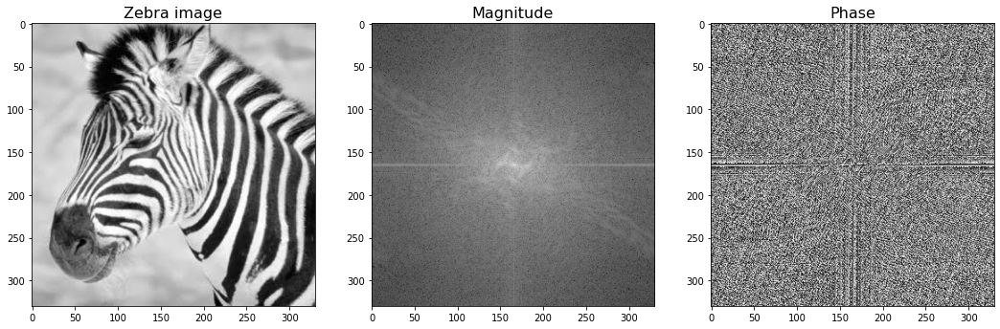

In [8]:
# Show magnitude and phase spectrum of FFT zebra
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
# show magnitude in logarithmic scale
ax[0].imshow(zebra_img, cmap="gray")
ax[0].set_title("Zebra image", fontsize=16)
ax[1].imshow(np.log(fft.fftshift(np.abs(fft_zebra))), cmap="gray")
ax[1].set_title("Magnitude", fontsize=16)
ax[2].imshow(fft.fftshift(np.angle(fft_zebra)), cmap="gray")
ax[2].set_title("Phase", fontsize=16)
plt.show()

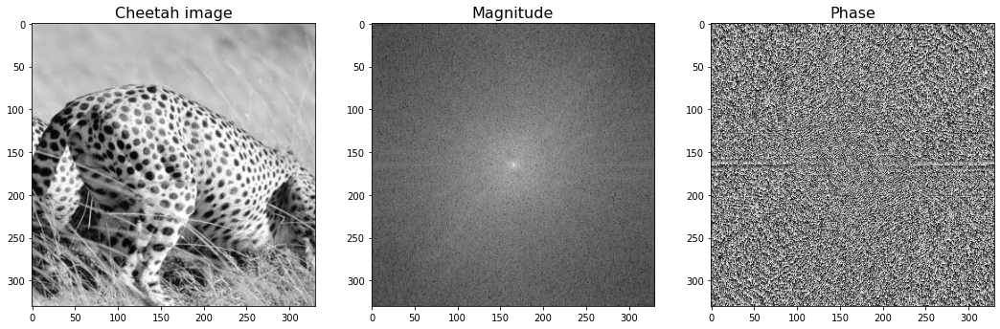

In [9]:
# Show magnitude and phase spectrum of FFT cheetah
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
# show magnitude in logarithmic scale
ax[0].imshow(cheetah_img, cmap="gray")
ax[0].set_title("Cheetah image", fontsize=16)
ax[1].imshow(np.log(fft.fftshift(np.abs(fft_cheetah))), cmap="gray")
ax[1].set_title("Magnitude", fontsize=16)
ax[2].imshow(fft.fftshift(np.angle(fft_cheetah)), cmap="gray")
ax[2].set_title("Phase", fontsize=16)
plt.show()

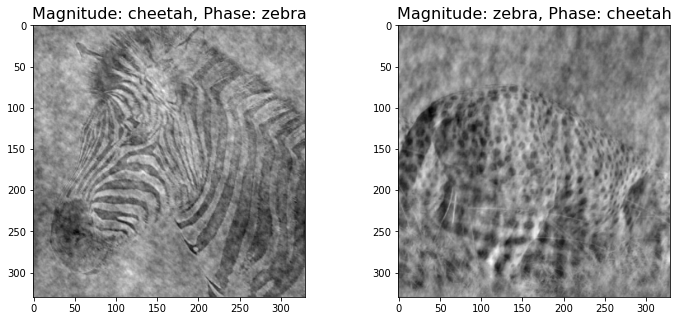

In [10]:
# Obtain new image from zebra phase & cheetah magnitude
zebra_mag = np.abs(fft_zebra)
zebra_phase = np.angle(fft_zebra)
cheetah_mag = np.abs(fft_cheetah)
cheetah_phase = np.angle(fft_cheetah)

# calculate the combined images
cheetah_mag_zebra_pha = np.multiply(cheetah_mag, np.exp(1j*zebra_phase))
cheetah_mag_zebra_pha_img = np.real(np.fft.ifft2(cheetah_mag_zebra_pha))

zebra_mag_cheetah_pha = np.multiply(zebra_mag, np.exp(1j*cheetah_phase))
zebra_mag_cheetah_pha_img = np.real(np.fft.ifft2(zebra_mag_cheetah_pha))

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(cheetah_mag_zebra_pha_img, cmap="gray")
ax[0].set_title("Magnitude: cheetah, Phase: zebra", fontsize=16)
ax[1].imshow(zebra_mag_cheetah_pha_img, cmap="gray")
ax[1].set_title("Magnitude: zebra, Phase: cheetah", fontsize=16)
plt.show()

## 5. Edge Detection

Write a gradient based edge detector.  Your code should load in
an image and convert to grayscale floats.  Once you have loaded in the image, 
you should smooth the image with a
Gaussian filter and then compute horizontal and vertical derivatives using the
derivative filter described in lecture.  The amount of smoothing is determined
by the $\sigma$ of the Gaussian (which should be a parameter of your code).
You can use **scipy.ndimage.convolve2d** option to perform the required
convolutions. Once you have computed the derivatives in the $x$ and $y$
directions using convolution, compute the gradient magnitude and angle
and threshold the magnitude to find the edge pixels. To do non-maximum 
suppression, you can use **skimage.morphology.thin** in order
to get out a 1-pixel-wide version of the detected edges.

### 5.1 Implementation

In [11]:
def normalize(mat):
    # min-max normalizer, scale pixels to [0, 255]
    M = np.copy(mat)
    M = np.float32(M)
    M = 255. * (M - M.min()) / (M.max() - M.min())
    return M

In [12]:
import skimage # for non-maximum suppression

def image_gradient(I,sigma=1):
    """
    Compute the gradient orientation and magnitude after
    smoothing I with a Gaussian filter with parameter sigma
    """
    smoothed = ndimage.gaussian_filter(I, sigma)
    kernel_x = np.tile(np.array([1, 0, -1]), (3, 1))
    kernel_y = kernel_x.T
    gx = conv(smoothed, kernel_x)
    gy = conv(smoothed, kernel_y)
    mag = np.hypot(gx, gy) # magnitude
    angle = np.arctan2(gy, gx)
    # normalize magnitude
    mag = normalize(mag)
    return mag, angle
    
    
def detect_edge(I,sigma,thresh):
    """
    Detect edges in an image using the given smoothing and threshold
    parameters.
    """
    mag, angle = image_gradient(I, sigma)
    mag[mag <= thresh] = 0
    edge = skimage.morphology.thin(mag)
    mag[edge == False] = 0
    return mag

### 5.2 Demonstration

For two images (the synthetic example below and an additional image of your choice), visualize the input image, gradient magnitude, angle and the edge detection output for two different settings of $\sigma$. This will yield 16 images in total. You should make sure that the image is low enough resolution and the plots large enough to clearly see the results. For visualizing the orientation, you should use a circular colormap such as "twilight" or "hsv". You should include colorbars on your plots where appropriate so the range of values is visible. 

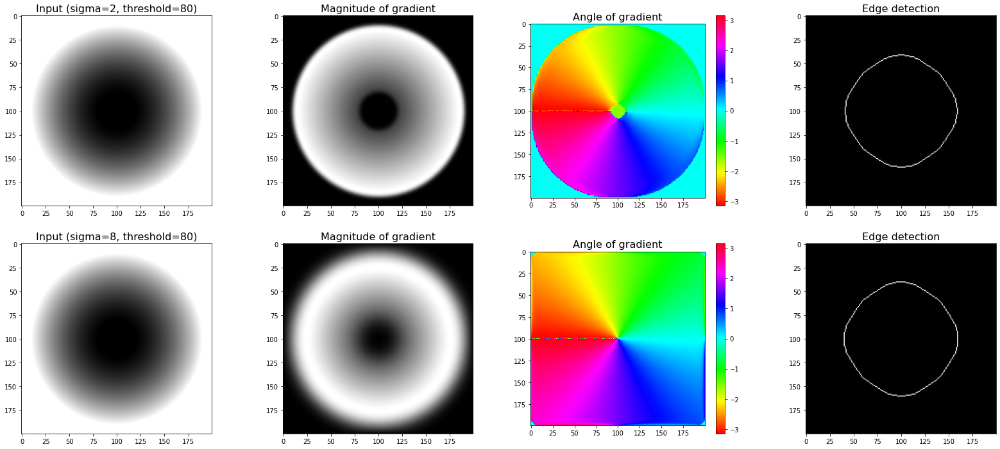

In [13]:
# set the plot figure size
plt.rcParams['figure.figsize'] = (28,12)

# synthetic test image for debugging purposes
[yy,xx] = np.mgrid[-100:100,-100:100]
image = np.minimum(np.maximum(np.array(xx*xx+yy*yy,dtype=float),400),8100)

th = 80
sigma = [2, 8]
fig, ax = plt.subplots(2, 4)
for i, s in enumerate(sigma):
    mag, angle = image_gradient(image, s)
    edge = detect_edge(image, sigma=s, thresh=th)
    ax[i][0].imshow(image, "gray")
    ax[i][1].imshow(mag, "gray")
    angle_show = ax[i][2].imshow(angle, "hsv")
    plt.colorbar(angle_show, ax=ax[i,2])
    ax[i][3].imshow(edge, "gray")
    ax[i][0].set_title("Input (sigma=%d, threshold=%d)" % (s, th), fontsize=16)
    ax[i][1].set_title("Magnitude of gradient", fontsize=16)
    ax[i][2].set_title("Angle of gradient", fontsize=16)
    ax[i][3].set_title("Edge detection", fontsize=16)
plt.show()

For the cat image, since the output of edge detection with cmap "gray" is hard to see, I changed the cmap to "binary", where value $0$ is white and $255$ is black.

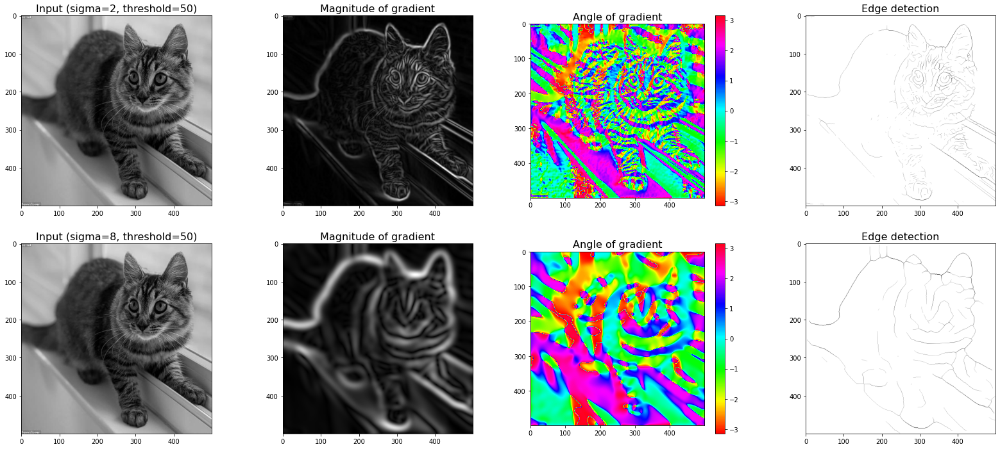

In [14]:
image = read_img("./test.jpg")
th = 50
sigma = [2, 8]
fig, ax = plt.subplots(2, 4)
for i, s in enumerate(sigma):
    mag, angle = image_gradient(image, s)
    edge = detect_edge(image, sigma=s, thresh=th)
    ax[i][0].imshow(image, "gray")
    ax[i][1].imshow(mag, "gray")
    angle_show = ax[i][2].imshow(angle, "hsv")
    plt.colorbar(angle_show, ax=ax[i,2])
    ax[i][3].imshow(edge, "binary")
    ax[i][0].set_title("Input (sigma=%d, threshold=%d)" % (s, th), fontsize=16)
    ax[i][1].set_title("Magnitude of gradient", fontsize=16)
    ax[i][2].set_title("Angle of gradient", fontsize=16)
    ax[i][3].set_title("Edge detection", fontsize=16)
plt.show()

## 6. Template Detection

Implement a simple object detector based on cross-correlation.  Load in one
of the test images provided and display it on the screen.  Clip out a patch
of the image containing an object you want to detect.  Use this patch as a template
in order to try and detect other instances of the object in the image.

You should implement three different variants for computing a match score $S$
between the template $T$ and the image $I$. 

1. Cross-correlation (CC): 

  $S(x,y) = \sum_{i,j} T[i,j]I[x+i,y+j]$


2. Normalized Cross-correlation (NCC): 

  $S(x,y) = \sum_{i,j} \frac{(T[i,j]-\mu_T)}{\sigma_T}\frac{(I[x+i,y+j]-\mu_{xy})}{\sigma_{xy}}$

  $\mu_{xy} = \frac{1}{HW}\sum_{i,j} I[x+i,y+j]$

  $\sigma_{xy} = \sqrt{\frac{1}{HW}\sum_{i,j} (I[x+i,y+j]-\mu_{xy})^2}$


3. Sum-of-squared-differences (SSD): 

  $S(x,y) = -\sum_{i,j} (T[i,j] - I[x+i,y+j])^2$

Note, that in each of these formulas the summation is ranging over H and W, the height
and width of the template T so $\mu_{xy}$ is a *local* average of the image brightness.
I've added a minus sign in front of SSD to make it consistent with the other two 
so that a larger score $S$ corresponds to a better match.

You can implement all of these quite effeciently using a couple convolutions and 
vectorized NumPy operations. If you use convolution to perform cross-correlation, 
don't forget to flip the template left-right and top-bottom. To compute averages,
you can use convolution with a filter of all 1s the same size as your template.

You can try thresholding the resulting score map $S$ but you will note that
around detected objects there will be many pixels with high values.  In order to
suppress non-maximal responses, zero out any locations which are smaller than one
of their 8 neighbors. You can do this effeciently in NumPy using array indexing, 
e.g. in 1D this might look like:

$$
L = x[1:-1] > x[0:-2]   #bigger than our neighbor to the left?
R = x[1:-1] > x[2:]     #bigger than our neighbor to the right?
T = x[1:-1] > threshold #above detection threshold?
maxima = R & L & T
$$

It is also probably a good idea to set an upper limit on the number of detections your
function returns (e.g., so if you happen to call it with too low a threshold things
don't get overly slow).

### 6.1 Implementation

In [15]:
def non_maximum_suppress(resp, thresh):
    # normalize M
    M = normalize(resp)
    # suppress non-maximal responses
    M_LEFT = np.roll(M, 1) # left column to current
    M_LEFT[:, 0] = 0
    M_RIGHT = np.roll(M, -1)
    M_RIGHT[:, -1] = 0
    M_UP = np.roll(M, -1, axis=0)
    M_UP[-1, :] = 0
    M_DOWN = np.roll(M, 1, axis=0)
    M_DOWN[0, :] = 0
    L = M > M_LEFT
    R = M > M_RIGHT
    U = M > M_UP
    D = M > M_DOWN
    T = M > thresh
    maxima = L & R & U & D & T
    # set all non maximum values to zero
    M[~maxima] = 0
    return M

def CC(I, T):
    return conv(I, np.flip(T))

def NCC(I, T):
    def _mean(I, T):
        HW = T.shape[0]*T.shape[1]
        kernel = np.ones(T.shape)
        return 1/HW * conv(I, kernel)

    def _std(I, T):
        HW = T.shape[0]*T.shape[1]
        kernel = np.ones(T.shape)
        term = conv((I - _mean(I, T))**2, kernel)
        term[term == 0] = 1e-2 # prevent div by 0
        return np.sqrt(1/HW * term)
    
    norm_I = (I - _mean(I, T)) / _std(I, T)
    norm_T = (T - np.mean(T)) / np.std(T)
    return CC(norm_I, norm_T)

def SSD(I, T):
    kernel_I = np.ones(I.shape)
    kernel_T = np.ones(T.shape)
    ssd = conv(I ** 2, kernel_T) - 2 * conv(I, np.flip(T)) + conv(kernel_I, np.flip(T**2))
    ssd[ssd == 0] = 1e-2 # prevent div by 0
    return -ssd

def detect_template(I, template, thresh=10, method="cc", ndetect=15):
    # calculate the score map
    if method == "cc":
        resp = CC(I, template)
    elif method == "ncc":
        resp = NCC(I, template)
    elif method == "ssd":
        resp = SSD(I, template)
    score = non_maximum_suppress(resp, thresh)
    
    # sort scores and get top n values (with corresponding x,y)
    val = np.sort(score, axis=None)[::-1] # sorted response values
    ind = np.argsort(score, axis=None)[::-1]  #corresponding indices
    
    # recover the x,y coordinates of the ith largest response
    [y,x] = np.unravel_index(ind, score.shape)
    
    # return matrix of xy and the score map (resp before non-maximum suppression)
    return np.stack([x[:ndetect], y[:ndetect]], axis=1), resp

### 6.2 Visualization and Discussion

Initially experiment with choosing a relatively small "object" such as Dilbert's nose or a 
single letter as your template. You can use the provided images but you should also experiment
with some image of your own choosing (ideally which contains more than one instance of the 
object of interest).

Plot the locations of above threshold local maxima on top of the original image using 
**patches.Rectangle**.  Experiment with the threshold to try to find a good tradeoff between 
detecting all the instances of an object and but not too many background detections.  Show 
a visualization of the template you used, the cross-correlation output using a false colormap 
(e.g. "jet"), and your final detection results.

Compare outputs of the three different methods (cc,ncc,ssd). You'll need to choose a different
threshold for each one. Discuss briefly which one appears to work the best and come up with 
an explanation as to why you think this is the case.

In [16]:
image = read_img("./dilbert1.jpg")
inv_image = 255 - image

For the Dilbert image, we need to invert the template and image first (white as 0 and black as 255). Since most pixels are in white, it could lead to a significant score result in the background after convolution.

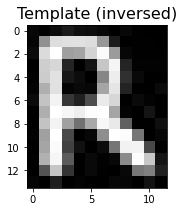

In [17]:
# create template (letter R)
template_r = inv_image[12:26, 55:67] # letter R
template_n = inv_image[12:26, 188:200] # letter N
template = template_r
plt.figure(figsize=(6, 3))
plt.imshow(template, "gray")
plt.title("Template (inversed)", fontsize=16)
plt.show()

First, we experiment with different thresholds using CC.

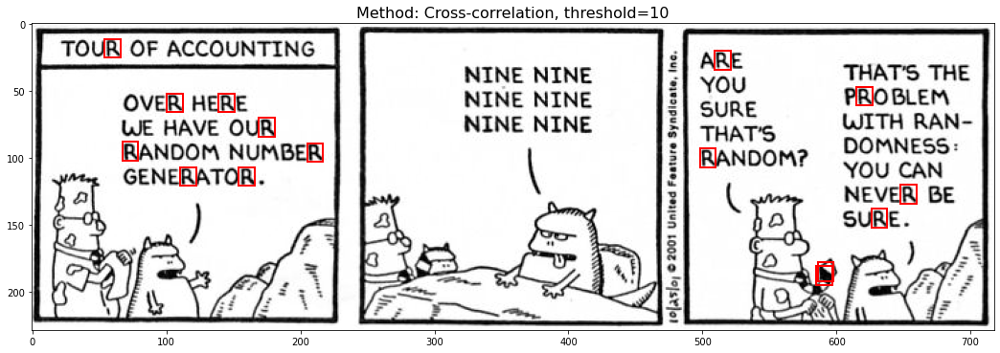

In [18]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

cc_detection, cc_score = detect_template(inv_image, template, thresh=10, method="cc", ndetect=15)
for i, j in cc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Cross-correlation, threshold=10", fontsize=16)
plt.show()

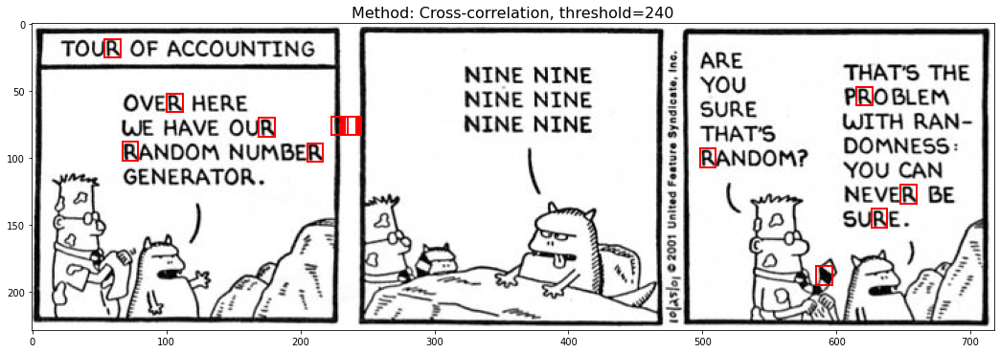

In [19]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

cc_detection, cc_score = detect_template(inv_image, template, thresh=240, method="cc", ndetect=15)
for i, j in cc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Cross-correlation, threshold=240", fontsize=16)
plt.show()

Some letters R are not detected under a higher threshold because the scores are not high enough and therefore are suppressed in the calculation. In contrast, CC with a lower threshold catches more objects because more possible candidates could be considered. However, changing different thresholds does not help find all letters in the image.

Next, we compare the outputs of three different methods (cc, ncc, ssd).

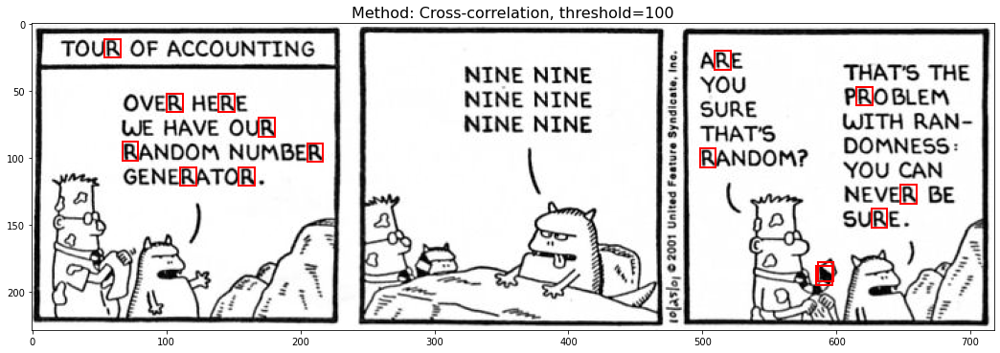

In [20]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

cc_detection, cc_score = detect_template(inv_image, template, thresh=100, method="cc", ndetect=15)

for i, j in cc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Cross-correlation, threshold=100", fontsize=16)
plt.show()

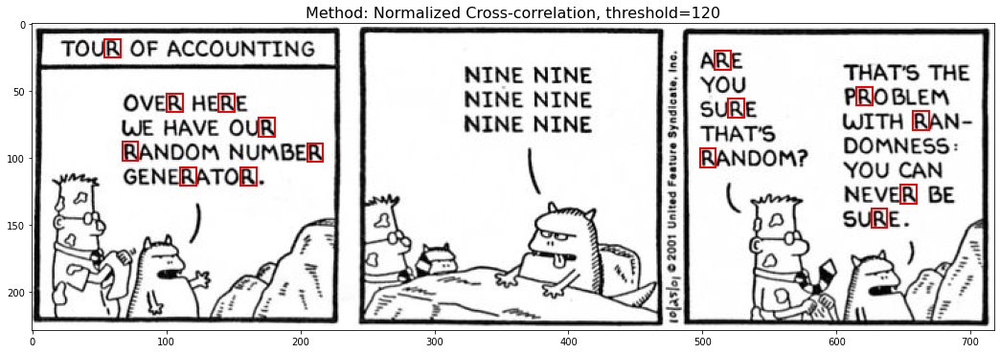

In [21]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ncc_detection, ncc_score = detect_template(inv_image, template, thresh=120, method="ncc", ndetect=15)

for i, j in ncc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Normalized Cross-correlation, threshold=120", fontsize=16)
plt.show()

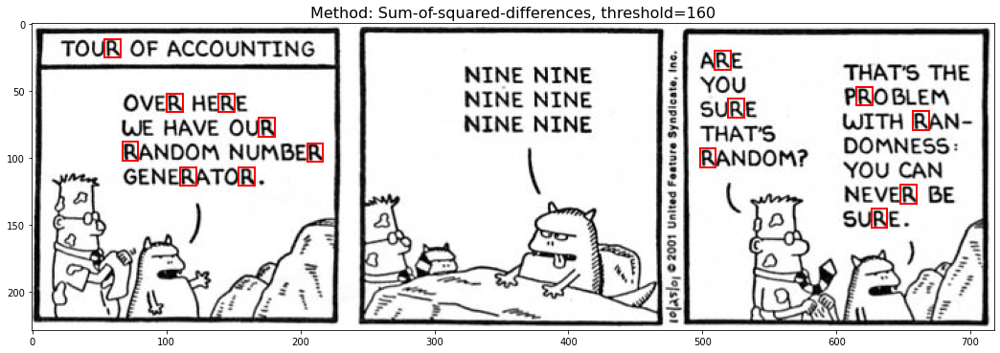

In [22]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ssd_detection, ssd_score = detect_template(inv_image, template, thresh=160, method="ssd", ndetect=15)

for i, j in ssd_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Sum-of-squared-differences, threshold=160", fontsize=16)
plt.show()

***your discussion of results goes here***

Looking at the result, we see that both NCC and SSD perform better than CC. In the score heat map (redder means a higher score), we can see that letter "R" in NCC and SSD seems brighter than in CC; this could be why NCC and SSD  have a better performance than CC. In the heat map of CC, Dilber's necktie also appears to have a higher score and, therefore, could be another reason why the region was detected as letter R.

Text(0.5, 1.0, 'Heat map of score, SSD')

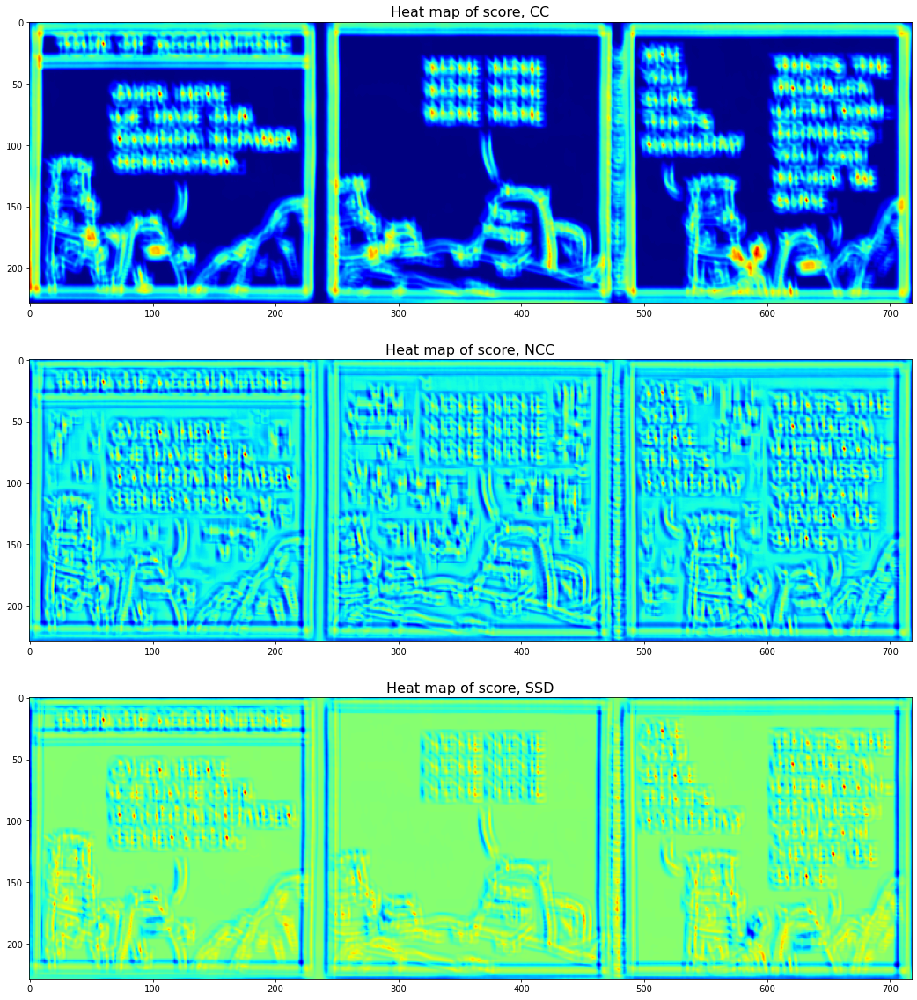

In [23]:
fig, ax = plt.subplots(3, 1, figsize=(18, 20))
ax[0].imshow(cc_score, "jet")
ax[0].set_title("Heat map of score, CC", fontsize=16)
ax[1].imshow(ncc_score, "jet")
ax[1].set_title("Heat map of score, NCC", fontsize=16)
ax[2].imshow(ssd_score, "jet")
ax[2].set_title("Heat map of score, SSD", fontsize=16)

Comparing NCC and SSD, by selecting the same threshold and the number of detections larger than the actual objects, we can see that NCC seems to detect more letters than SSD. While both methods can successfully detect all letter Rs in the image, NCC's result might not be a good outcome considering the object we desired to detect since it might yield more false results. Therefore, I think SSD performs slightly better than NCC in this image.

The results are as follows:

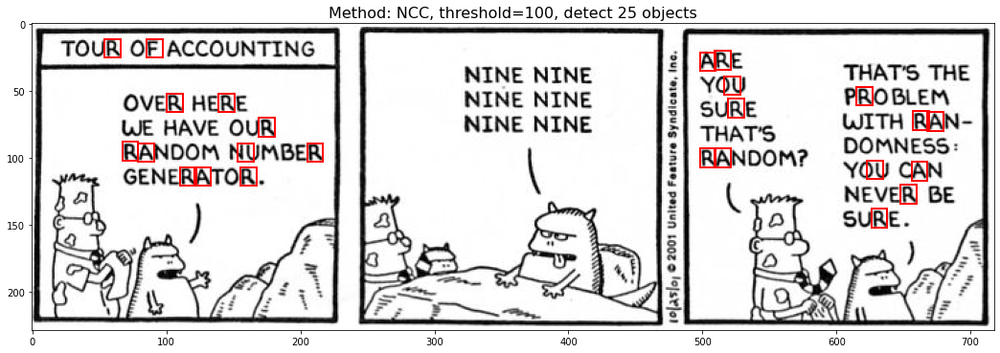

In [24]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ncc_detection, ncc_score = detect_template(inv_image, template, thresh=100, method="ncc", ndetect=25)

for i, j in ncc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: NCC, threshold=100, detect 25 objects", fontsize=16)
plt.show()

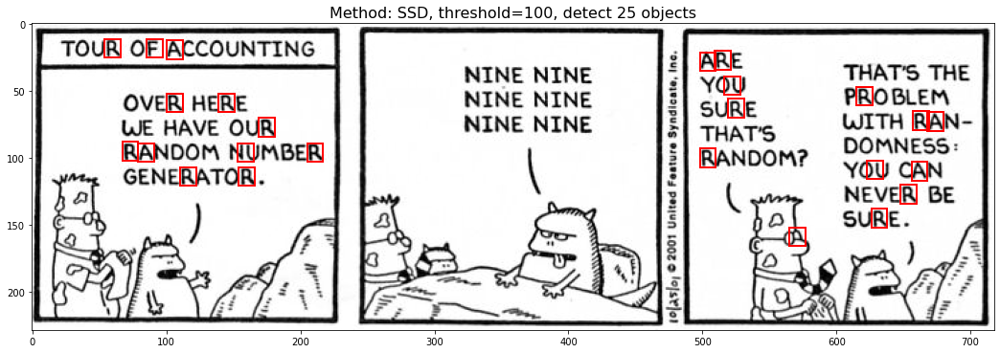

In [25]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ssd_detection, ssd_score = detect_template(inv_image, template, thresh=100, method="ssd", ndetect=25)

for i, j in ssd_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: SSD, threshold=100, detect 25 objects", fontsize=16)
plt.show()

We also try to detect letter N in the image, using the same settings as the previous example:

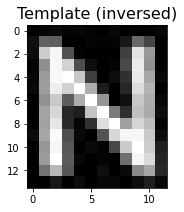

In [26]:
template = template_n
plt.figure(figsize=(6, 3))
plt.imshow(template, "gray")
plt.title("Template (inversed)", fontsize=16)
plt.show()

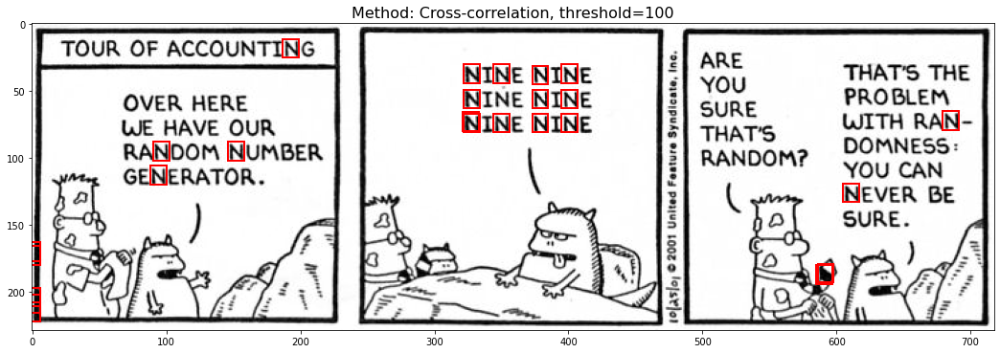

In [27]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

cc_detection, cc_score = detect_template(inv_image, template, thresh=100, method="cc", ndetect=25)

for i, j in cc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Cross-correlation, threshold=100", fontsize=16)
plt.show()

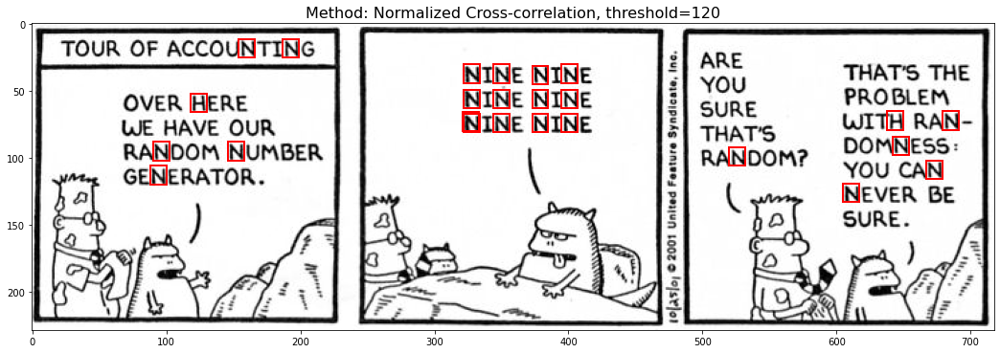

In [28]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ncc_detection, ncc_score = detect_template(inv_image, template, thresh=120, method="ncc", ndetect=25)

for i, j in ncc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Normalized Cross-correlation, threshold=120", fontsize=16)
plt.show()

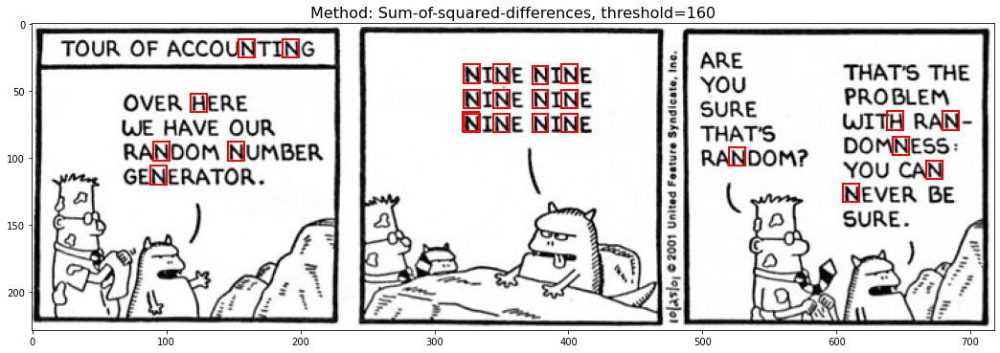

In [29]:
plt.figure(figsize=(18, 8))
ax = plt.gca()
plt.imshow(image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ssd_detection, ssd_score = detect_template(inv_image, template, thresh=160, method="ssd", ndetect=25)

for i, j in ssd_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: Sum-of-squared-differences, threshold=160", fontsize=16)
plt.show()

We also try applying template matching on the Simpsons image with all three methods:

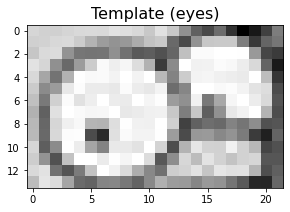

In [30]:
simpsons_image = read_img("./simpsons.jpg")
template = simpsons_image[222:236, 465:487] # Homer's eyes
plt.figure(figsize=(6, 3))
plt.imshow(template, "gray")
plt.title("Template (eyes)", fontsize=16)
plt.show()

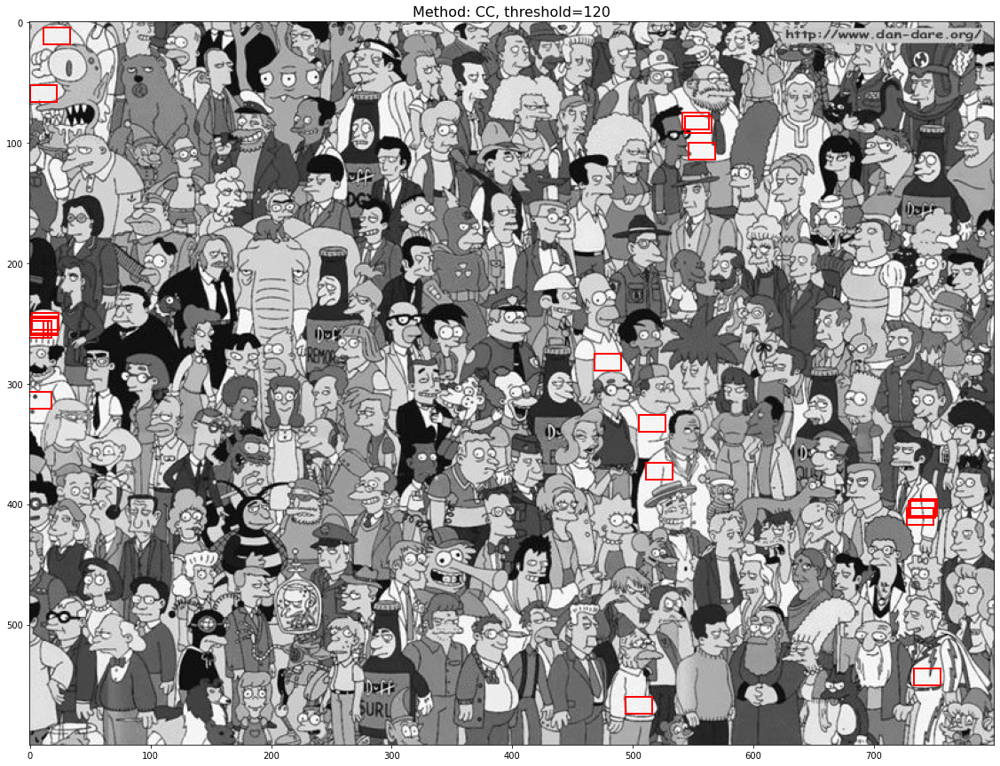

In [31]:
plt.figure(figsize=(20, 15))
ax = plt.gca()
plt.imshow(simpsons_image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

cc_detection, cc_score = detect_template(simpsons_image, template, thresh=120, method="cc", ndetect=20)

for i, j in cc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: CC, threshold=120", fontsize=16)
plt.show()

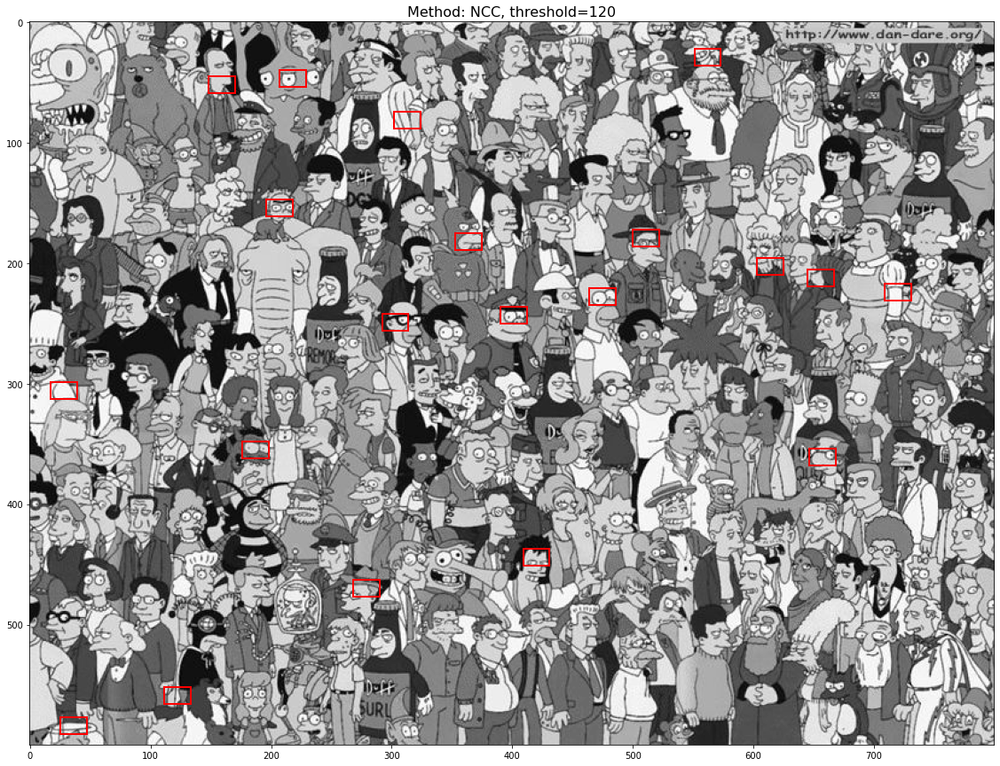

In [32]:
plt.figure(figsize=(20, 15))
ax = plt.gca()
plt.imshow(simpsons_image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ncc_detection, ncc_score = detect_template(simpsons_image, template, thresh=120, method="ncc", ndetect=20)

for i, j in ncc_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: NCC, threshold=120", fontsize=16)
plt.show()

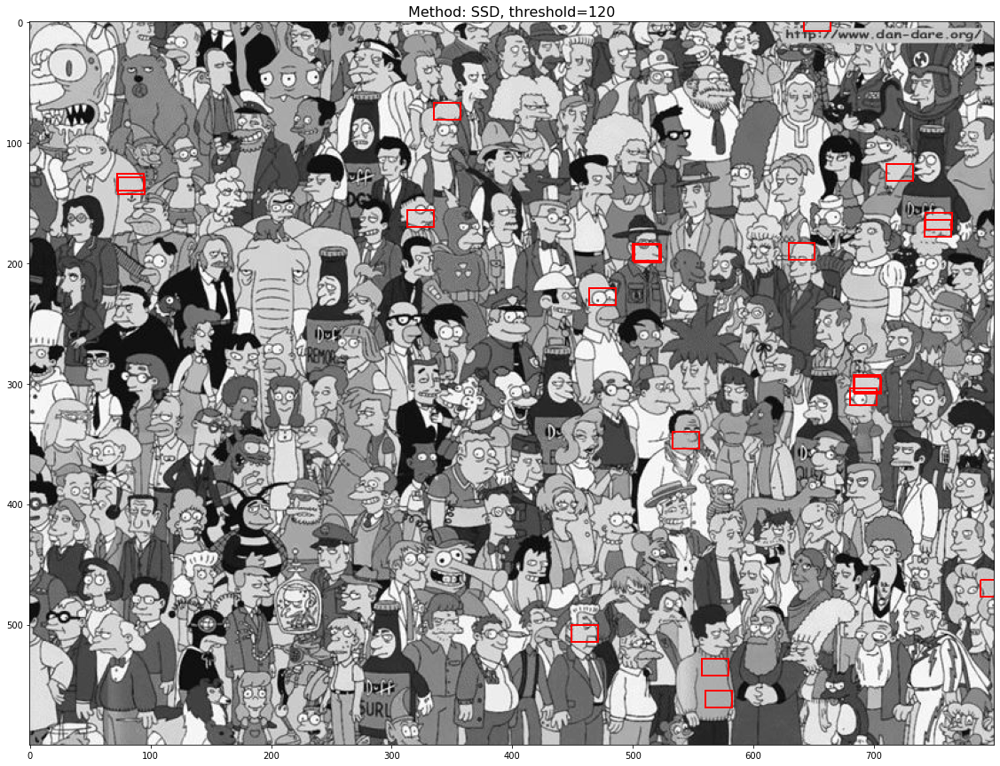

In [33]:
plt.figure(figsize=(20, 15))
ax = plt.gca()
plt.imshow(simpsons_image, "gray")
w = template.shape[1] #size of the template
h = template.shape[0]
ct = 0

ssd_detection, ssd_score = detect_template(simpsons_image, template, thresh=120, method="ssd", ndetect=20)

for i, j in ssd_detection:
    xc = i-(w//2)
    yc = j-(h//2)
    rect = patches.Rectangle((xc,yc),w,h,linewidth=2,edgecolor=np.array([1,0,0]),facecolor='none')
    ax.add_patch(rect)
    ct = ct + 1
plt.title("Method: SSD, threshold=120", fontsize=16)
plt.show()

So NCC outperforms CC and SSD in this example since it captured more eyes than the other two methods. However, SSD is still better than CC since CC fails to capture Homer's eyes.